# Low Light Enhancement Inference Tutorial
> 저조도 개선 모델

## installation
- gpu docker image 
    - pytorch/pytorch:1.7.1-cuda11.0-cudnn8-devel
```bash
pip install -r requirements.txt
pip install -e .
```
- cpu docker image
    - python:3.8.16-slim
```bash
pip install -r requirements.txt
pip install -e .
```
- pretrained model link
  - https://drive.google.com/drive/folders/16O7QUckBZNdUb89zJp94KSJ_3IhuIczb?usp=drive_link

### inference
```python 
class GtGenlleInference(GtGenlleEvaluation, GtGenModelInferenceAbstract): 
    def __init__(self,
                 devices: str = '0',
                 save_log: bool = False,
                 print_log: bool = False,
                 pretrained_path: str = ''
                ):
        
    super().__init__(devices = devices, 
                         batch_size = 1,
                         num_workers = 1,
                         pretrained_path = pretrained_path
                     
    def inference(
        self,
        input_img_path: str,
    ) -> np.ndarray:
                     
    def inference_img(
        self,
        img, 
    ) -> np.ndarray:
```
- devices : gpu id
- def inference : image가 있는 경로 입력해서 추론
- def inference_img : numpy or image 경로 입력해서 추론

In [1]:
from gtgen.lle.inference import GtGenlleInference
from PIL import Image
import matplotlib.pyplot as plt
import pprint
import os
import torch


device_id = torch.cuda.current_device()
pretrained_path = '/ext/Dataset/lle/lle_model.pth'
lle_inf = GtGenlleInference(devices=device_id, pretrained_path = pretrained_path) 

# load model - return bool
lle_inf.load_model()

/opt/conda/lib/python3.8/site-packages/torch/cuda/__init__.py:104: UserWarning: 
NVIDIA GeForce RTX 3090 with CUDA capability sm_86 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70 sm_75.
If you want to use the NVIDIA GeForce RTX 3090 GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


True

In [3]:
sample_img_dir = './sample_img'
# sample_img_dir = '/ext/Dataset/AD/val-ad/'

for (path, dir, files) in os.walk(sample_img_dir):
    for file in files:
        img_path = f'{path}/{file}'
        raw_image = Image.open(img_path)
        enhance_image_numpy = lle_inf.inference(img_path)
        enhance_image = Image.fromarray(enhance_image_numpy)
        # print(1)
        raw_image = raw_image.resize((300,200))
        enhance_image = enhance_image.resize((300,200))
        raw_image.show()
        enhance_image.show()

RuntimeError: CUDA error: no kernel image is available for execution on the device

<class 'numpy.ndarray'>
1 bath inference :	fps:27.407840139054976, speed:0.036485910415649414


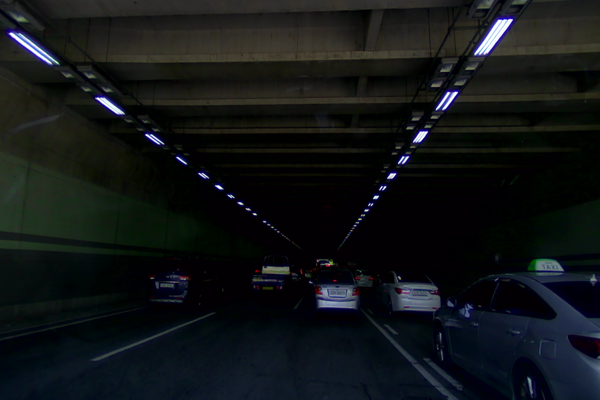

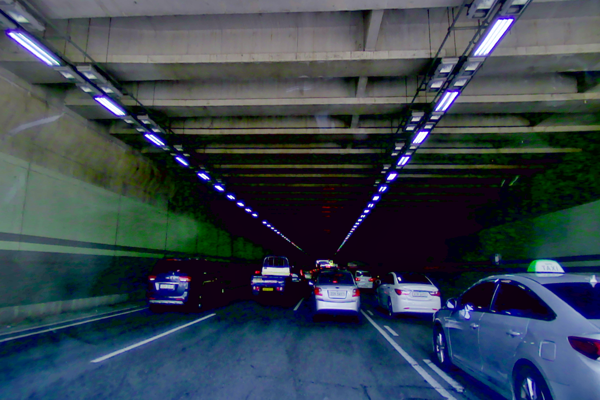

In [5]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

img_path = './sample_img/1652685831689_FR-View-CMR-Wide.png'
file_name = img_path.split('/')[-1]
raw_image = Image.open(img_path)
np_img = np.array(raw_image) # numpy
print(type(np_img))
enhance_image_numpy = lle_inf.inference_img(np_img)
enhance_image = Image.fromarray(enhance_image_numpy)
enhance_image = enhance_image.resize((600,400))
raw_image = raw_image.resize((600,400))
raw_image.show()
enhance_image.show()

---
### cpu inference

In [1]:
from gtgen.lle.inference import GtGenlleInference
from PIL import Image
import matplotlib.pyplot as plt
import pprint
import os

pretrained_path = '/ext/Dataset/lle/lle_model.pth'
lle_inf = GtGenlleInference(devices=-1, pretrained_path = pretrained_path) 

# load model - return bool
lle_inf.load_model()

/root/anaconda3/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/root/anaconda3/lib/python3.8/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


True

<class 'numpy.ndarray'>
1 bath inference :	fps:5.851722463739808, speed:0.17088985443115234


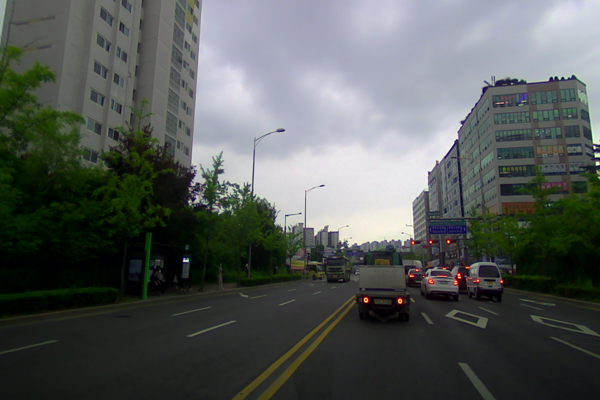

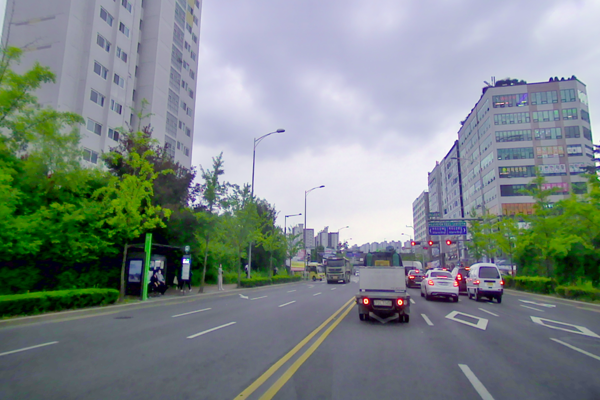

In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

img_path = './sample_img/1653894520488_FR-View-CMR-Wide.png'
file_name = img_path.split('/')[-1]
raw_image = Image.open(img_path)
np_img = np.array(raw_image) # numpy
print(type(np_img))
enhance_image_numpy = lle_inf.inference_img(np_img)
enhance_image = Image.fromarray(enhance_image_numpy)
enhance_image = enhance_image.resize((600,400))
raw_image = raw_image.resize((600,400))
raw_image.show()
enhance_image.show()

---
### 이미지 저장
```python
def get_save_img(
        self,
        img_arr_np,
        file_path = ''
        ):
    
def get_save_twin_img(
        self,
        raw_img_np,
        lle_img_np,
        file_path = ''
    ):    
```   

<class 'numpy.ndarray'>
1 bath inference :	fps:6.5868429731300155, speed:0.15181779861450195


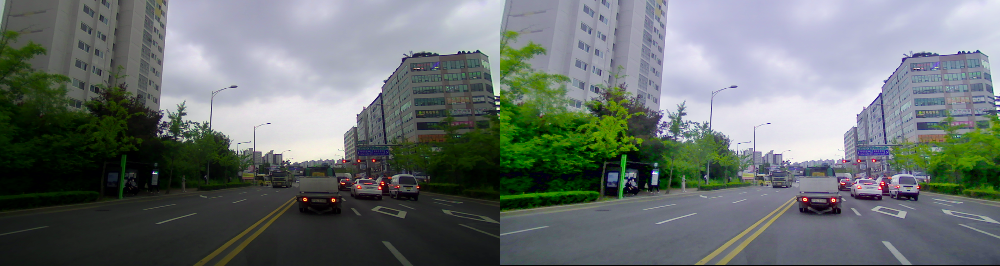

In [6]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

img_path = './sample_img/1653894520488_FR-View-CMR-Wide.png'
file_name = img_path.split('/')[-1]
raw_image = Image.open(img_path)
raw_image_numpy = np.array(raw_image) # numpy
print(type(raw_image_numpy))

enhance_image_numpy = lle_inf.inference_img(raw_image_numpy)

# ! -- 저장 
result_path = '/ext/Dataset/lle'
lle_inf.get_save_img(enhance_image_numpy, f'{result_path}/enhance_image.jpg')
lle_inf.get_save_twin_img(raw_image_numpy, enhance_image_numpy, f'{result_path}/enhance_twin_image.jpg')


### 원본 추론
- 권장하지 않음
- cpu에서 성능 차이가 심함

In [6]:
from gtgen.lle.inference import GtGenlleInference
from PIL import Image
import matplotlib.pyplot as plt
import pprint
import os
import torch


pretrained_path = '/ext/Dataset/lle/lle_model.pth'
lle_inf = GtGenlleInference(devices=-1, pretrained_path = pretrained_path, raw_image_inf = True) 

# load model - return bool
lle_inf.load_model()

True

1 bath inference :	fps:0.4071408138207396, speed:2.4561526775360107


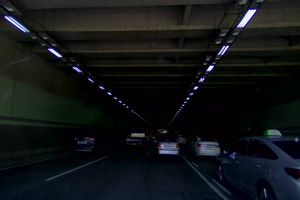

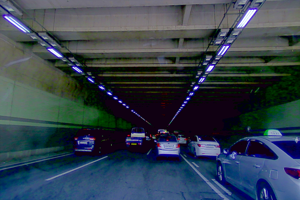

1 bath inference :	fps:0.43624348568436694, speed:2.292297840118408


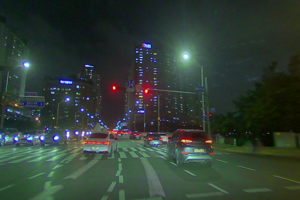

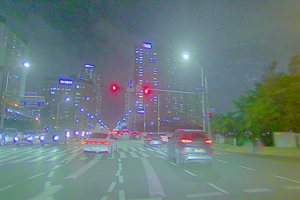

1 bath inference :	fps:0.4293300643559451, speed:2.3292102813720703


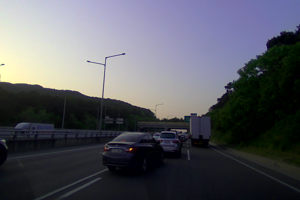

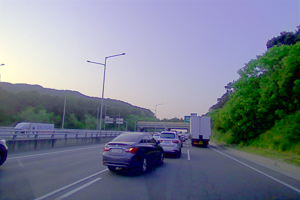

1 bath inference :	fps:0.41954061331911896, speed:2.383559465408325


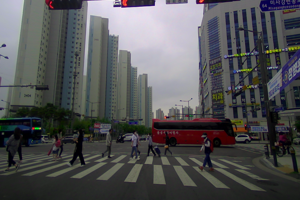

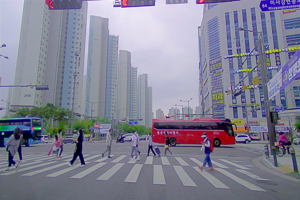

1 bath inference :	fps:0.4307160654176806, speed:2.3217151165008545


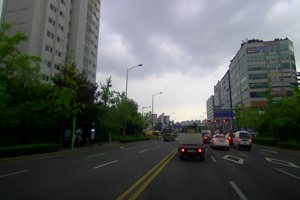

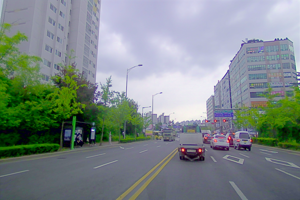

1 bath inference :	fps:0.43290732450048963, speed:2.3099632263183594


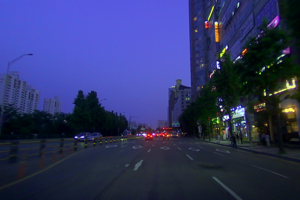

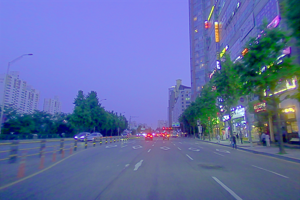

In [7]:
sample_img_dir = './sample_img'
# sample_img_dir = '/ext/Dataset/AD/val-ad/'

for (path, dir, files) in os.walk(sample_img_dir):
    for file in files:
        img_path = f'{path}/{file}'
        raw_image = Image.open(img_path)
        enhance_image_numpy = lle_inf.inference(img_path)
        enhance_image = Image.fromarray(enhance_image_numpy)
        # print(1)
        raw_image = raw_image.resize((300,200))
        enhance_image = enhance_image.resize((300,200))
        raw_image.show()
        enhance_image.show()